In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shapely.geometry
import seaborn as sns
import plotly.express as px
import re
from matplotlib.colors import TwoSlopeNorm
import missingno as msno
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'
pd.set_option('display.max_columns', None)

In [3]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['figure.dpi'] = 200

In [4]:
# Projected Coordinate System: how you project onto a 2D plane
epsg_2d = 26717 
# Toronto Police Service Open Data includes geographic location information provided in
# the projected coordinate system NAD 1927 UTM 17N
# https://epsg.io/26717

# Geographic Coordinate System: how coordinates are represented in a 3D space
# World Geodetic System 1984 (WGS84)
# https://epsg.io/4326
epsg_3d = 4326 

# Import stations

In [5]:
stations_point = gpd.read_file('./clean_data/stations_point.geojson')
stations_area = gpd.read_file('./clean_data/stations_area.geojson')

In [6]:
# radius in km
radius = (stations_area.to_crs(epsg_2d)['geometry'].iloc[0].area / np.pi)**0.5 / 10**3

Text(0.5, 1.0, 'TTC subway stations with radius of 0.40km')

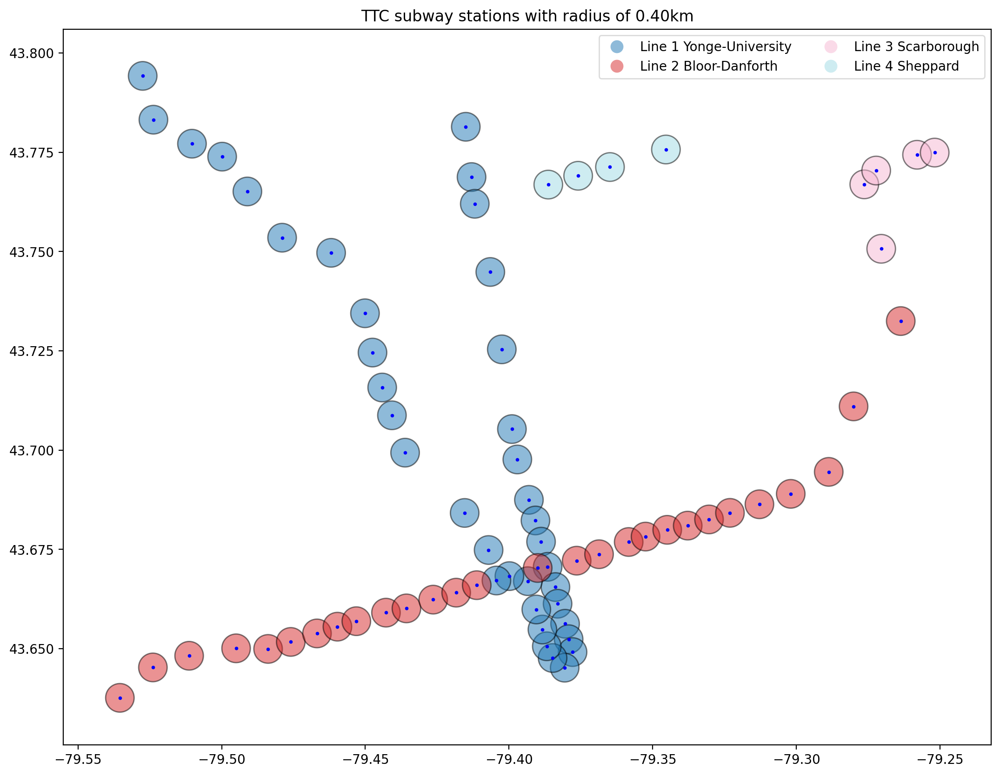

In [7]:
ax = stations_area.plot(column = 'line', 
                        edgecolor = 'black', 
                        alpha = 0.5,
                        cmap = 'tab20',
                        legend = True,
                        legend_kwds = {'loc': 'upper right', 
                                       'ncol': 2,
                                       'edgecolor': 'lightgrey'})
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)
plt.title(f'TTC subway stations with radius of {radius:0.2f}km')

# Import neighbourhoods

In [5]:
neighbourhoods = gpd.read_file('./clean_data/neighbourhoods.geojson')
neighbourhoods.head()

,OBJECTID,Neighbourhood,Hood_ID,F2020_Population_Projection,Assault_Count2014,Assault_Count2015,Assault_Count2016,Assault_Count2017,Assault_Count2018,Assault_Count2019,Assault_Count2020,Assault_Rate2014,Assault_Rate2015,Assault_Rate2016,Assault_Rate2017,Assault_Rate2018,Assault_Rate2019,Assault_Rate2020,AutoTheft_Count2014,AutoTheft_Count2015,AutoTheft_Count2016,AutoTheft_Count2017,AutoTheft_Count2018,AutoTheft_Count2019,AutoTheft_Count2020,AutoTheft_Rate2014,AutoTheft_Rate2015,AutoTheft_Rate2016,AutoTheft_Rate2017,AutoTheft_Rate2018,AutoTheft_Rate2019,AutoTheft_Rate2020,BreakAndEnter_Count2014,BreakAndEnter_Count2015,BreakAndEnter_Count2016,BreakAndEnter_Count2017,BreakAndEnter_Count2018,BreakAndEnter_Count2019,BreakAndEnter_Count2020,BreakAndEnter_Rate2014,BreakAndEnter_Rate2015,BreakAndEnter_Rate2016,BreakAndEnter_Rate2017,BreakAndEnter_Rate2018,BreakAndEnter_Rate2019,BreakAndEnter_Rate2020,Robbery_Count2014,Robbery_Count2015,Robbery_Count2016,Robbery_Count2017,Robbery_Count2018,Robbery_Count2019,Robbery_Count2020,Robbery_Rate2014,Robbery_Rate2015,Robbery_Rate2016,Robbery_Rate2017,Robbery_Rate2018,Robbery_Rate2019,Robbery_Rate2020,TheftOver_Count2014,TheftOver_Count2015,TheftOver_Count2016,TheftOver_Count2017,TheftOver_Count2018,TheftOver_Count2019,TheftOver_Count2020,TheftOver_Rate2014,TheftOver_Rate2015,TheftOver_Rate2016,TheftOver_Rate2017,TheftOver_Rate2018,TheftOver_Rate2019,TheftOver_Rate2020,Homicide_Count2014,Homicide_Count2015,Homicide_Count2016,Homicide_Count2017,Homicide_Count2018,Homicide_Count2019,Homicide_Count2020,Homicide_Rate2014,Homicide_Rate2015,Homicide_Rate2016,Homicide_Rate2017,Homicide_Rate2018,Homicide_Rate2019,Homicide_Rate2020,Shootings_Count2014,Shootings_Count2015,Shootings_Count2016,Shootings_Count2017,Shootings_Count2018,Shootings_Count2019,Shootings_Count2020,Shootings_Rate2014,Shootings_Rate2015,Shootings_Rate2016,Shootings_Rate2017,Shootings_Rate2018,Shootings_Rate2019,Shootings_Rate2020,Shape__Area,Shape__Length,district,Assault_Density2014,Assault_Density2015,Assault_Density2016,Assault_Density2017,Assault_Density2018,Assault_Density2019,Assault_Density2020,AutoTheft_Density2014,AutoTheft_Density2015,AutoTheft_Density2016,AutoTheft_Density2017,AutoTheft_Density2018,AutoTheft_Density2019,AutoTheft_Density2020,BreakAndEnter_Density2014,BreakAndEnter_Density2015,BreakAndEnter_Density2016,BreakAndEnter_Density2017,BreakAndEnter_Density2018,BreakAndEnter_Density2019,BreakAndEnter_Density2020,Homicide_Density2014,Homicide_Density2015,Homicide_Density2016,Homicide_Density2017,Homicide_Density2018,Homicide_Density2019,Homicide_Density2020,Robbery_Density2014,Robbery_Density2015,Robbery_Density2016,Robbery_Density2017,Robbery_Density2018,Robbery_Density2019,Robbery_Density2020,Shootings_Density2014,Shootings_Density2015,Shootings_Density2016,Shootings_Density2017,Shootings_Density2018,Shootings_Density2019,Shootings_Density2020,TheftOver_Density2014,TheftOver_Density2015,TheftOver_Density2016,TheftOver_Density2017,TheftOver_Density2018,TheftOver_Density2019,TheftOver_Density2020,All_2014,Population_2014,All_Rate2014,All_Density2014,All_2015,Population_2015,All_Rate2015,All_Density2015,All_2016,Population_2016,All_Rate2016,All_Density2016,All_2017,Population_2017,All_Rate2017,All_Density2017,All_2018,Population_2018,All_Rate2018,All_Density2018,All_2019,Population_2019,All_Rate2019,All_Density2019,All_Count2020,Population_2020,All_Rate2020,All_Density2020,geometry
0,1,Yonge-St.Clair,97,14083,16,25,34,25,28,35,23,127.0144,196.1246,262.5482,189.1790,207.2846,253.8071,163.3175,2,3,7,2,6,6,9,15.8768,23.53495,54.05405,15.13432,44.41812,43.50979,63.90684,37,20,12,18,24,28,26,293.7207,156.8997,92.66409,136.2088,177.6725,203.0457,184.6198,4,1,6,1,1,4,5,31.75359,7.844983,46.33205,7.567159,7.40302,29.00653,35.50380,3,5,7,0,3,6,3,23.81519,39.22491,54.05405,0.00000,22.20906,43.50979,21.30228,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,1,0,0,0,0,0.000000,0.000000,7.722008,0.0

In [6]:
crime_counts = sorted(list(set([re.search('[a-zA-Z]+_Count', x).group(0) for x in neighbourhoods.columns.values if re.search('[a-zA-Z]+_Count', x) is not None])))
crime_counts

['All_Count',
 'Assault_Count',
 'AutoTheft_Count',
 'BreakAndEnter_Count',
 'Homicide_Count',
 'Robbery_Count',
 'Shootings_Count',
 'TheftOver_Count']

In [7]:
crime_rates = sorted(list(set([re.search('[a-zA-Z]+_Rate', x).group(0) for x in neighbourhoods.columns.values if re.search('[a-zA-Z]+_Rate', x) is not None])))
crime_rates

['All_Rate',
 'Assault_Rate',
 'AutoTheft_Rate',
 'BreakAndEnter_Rate',
 'Homicide_Rate',
 'Robbery_Rate',
 'Shootings_Rate',
 'TheftOver_Rate']

In [10]:
crime_density = sorted(list(set([re.search('[a-zA-Z]+_Density', x).group(0) for x in neighbourhoods.columns.values if re.search('[a-zA-Z]+_Density', x) is not None])))
crime_density

['All_Density',
 'Assault_Density',
 'AutoTheft_Density',
 'BreakAndEnter_Density',
 'Homicide_Density',
 'Robbery_Density',
 'Shootings_Density',
 'TheftOver_Density']

In [9]:
years = sorted(list(set([re.search('[0-9]+', x).group(0) for x in neighbourhoods.columns.values if re.search('[0-9]+', x) is not None])))
years

['2014', '2015', '2016', '2017', '2018', '2019', '2020']

In [12]:
population = sorted(list(set([re.search('Population_\d{4}', x).group(0) for x in neighbourhoods.columns.values if re.search('Population_\d{4}', x) is not None])))
population

['Population_2014',
 'Population_2015',
 'Population_2016',
 'Population_2017',
 'Population_2018',
 'Population_2019',
 'Population_2020']

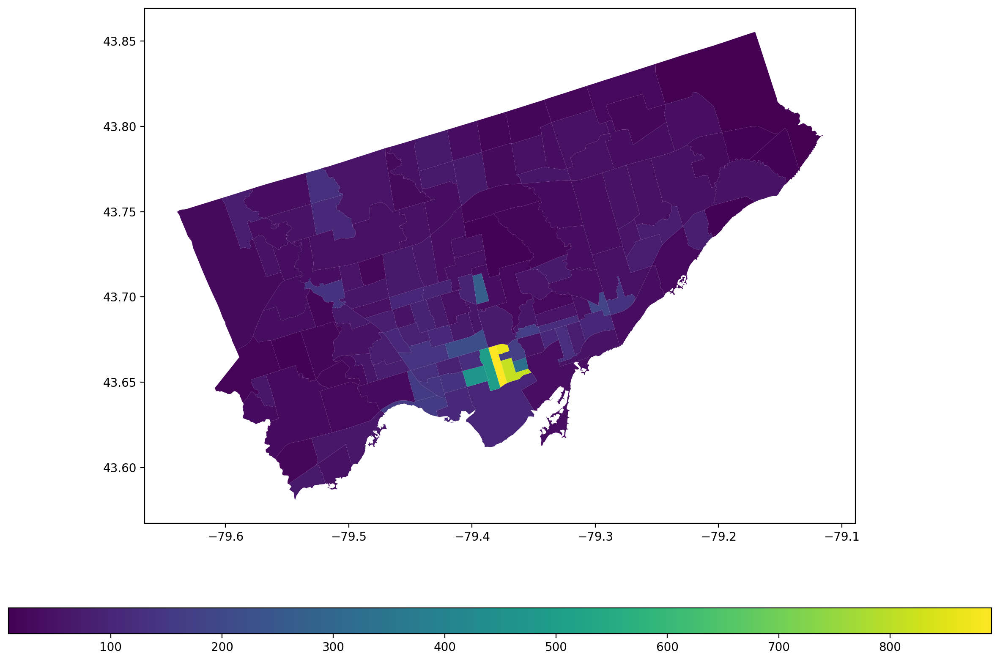

In [39]:
fig, ax = plt.subplots(1, 1)
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=1)
im2 = neighbourhoods.plot(column = 'All_Density' + str('2020'), 
                         cmap = 'viridis',
                         legend = True,
                         ax = ax,
                         cax = cax,
                         legend_kwds = {'orientation': 'horizontal'},
                         )


In [46]:
def plot_crime(var, title):
    fig, axes = plt.subplots(len(years), len(var))

    for j in range(axes.shape[1]):
        # fix the range for the colorbar so we can compare across years for each crime rate
        vmin, vmax = neighbourhoods[[var[j] + str(year) for year in years]].min().min(), neighbourhoods[[var[j] + str(year) for year in years]].max().max()
        norm = TwoSlopeNorm(vmin=vmin, vcenter= np.mean([vmin, vmax]), vmax=vmax)
        for i in range(axes.shape[0]):  
            neighbourhoods.plot(column = var[j] + str(years[i]), 
                                cmap = 'viridis',
                                norm = norm,
                                ax = axes[i, j])
        
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].set_yticks([])
            if i == 0:
                axes[i,j].set_title(var[j].split("_")[0])
            if j == 0:
                axes[i,j].set_ylabel(years[i], rotation=90, size='large')

    # fig.tight_layout()

    fig.suptitle(title, size='xx-large')

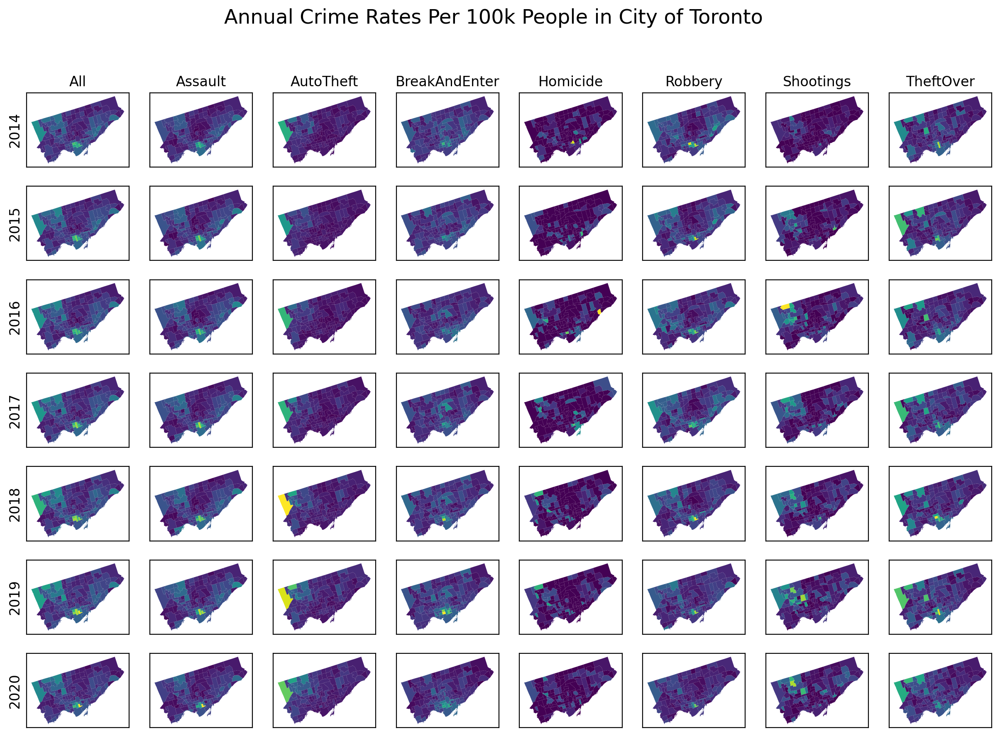

In [47]:
plot_crime(crime_rates, 'Annual Crime Rates Per 100k People in City of Toronto')

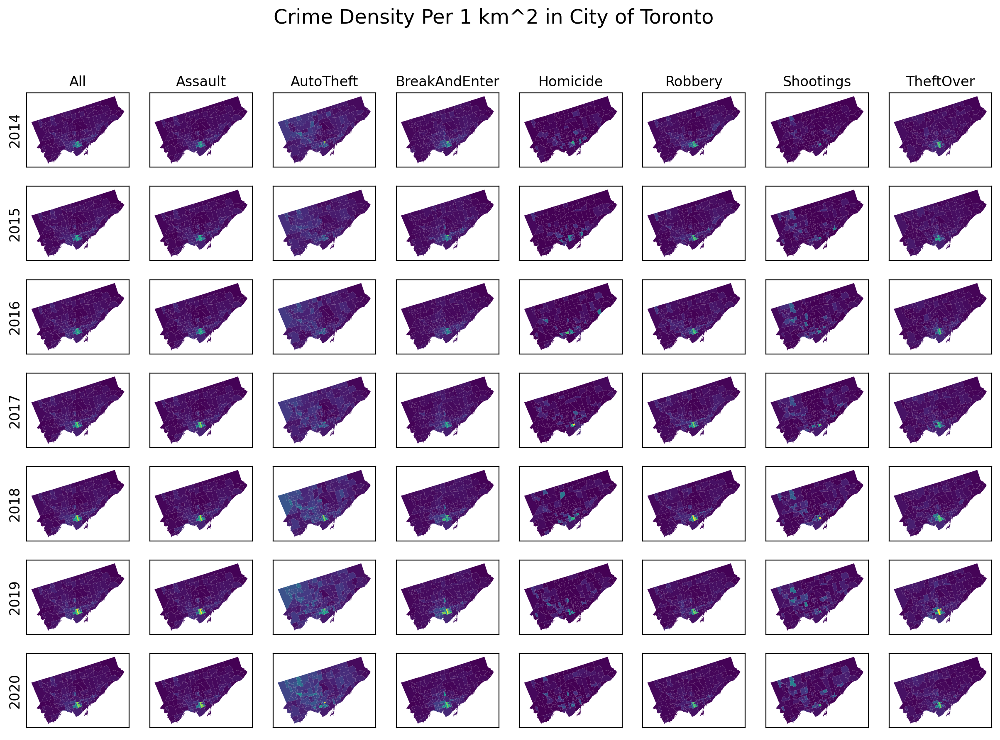

In [24]:
plot_crime(crime_density, 'Crime Density Per 1 km^2 in City of Toronto')

In [25]:
# plotly version
# crime_allrate = pd.wide_to_long(neighborhoods[['Neighbourhood', 'Hood_ID', 'geometry'] + ['All_Rate' + str(year) for year in years]], 
#                                   stubnames= "All_Rate", 
#                                   i=['Neighbourhood', 'Hood_ID'], 
#                                   j='year',
#                                   sep='').reset_index()

# crime_allrate.head()

# fig = px.choropleth(crime_allrate, 
#               geojson=crime_allrate.geometry,
#               locations=crime_allrate.index,
#               color = 'All_Rate',
#               animation_frame='year',
#               color_continuous_scale="Viridis",
#               hover_data=['Neighbourhood'])
# fig.update_geos(fitbounds="locations", visible=False)

In [26]:
neighborhoods[crime_rates[0] + '2020'].min()

386.4591048544157

Text(0.5, 257.52801096780723, 'Longitude')

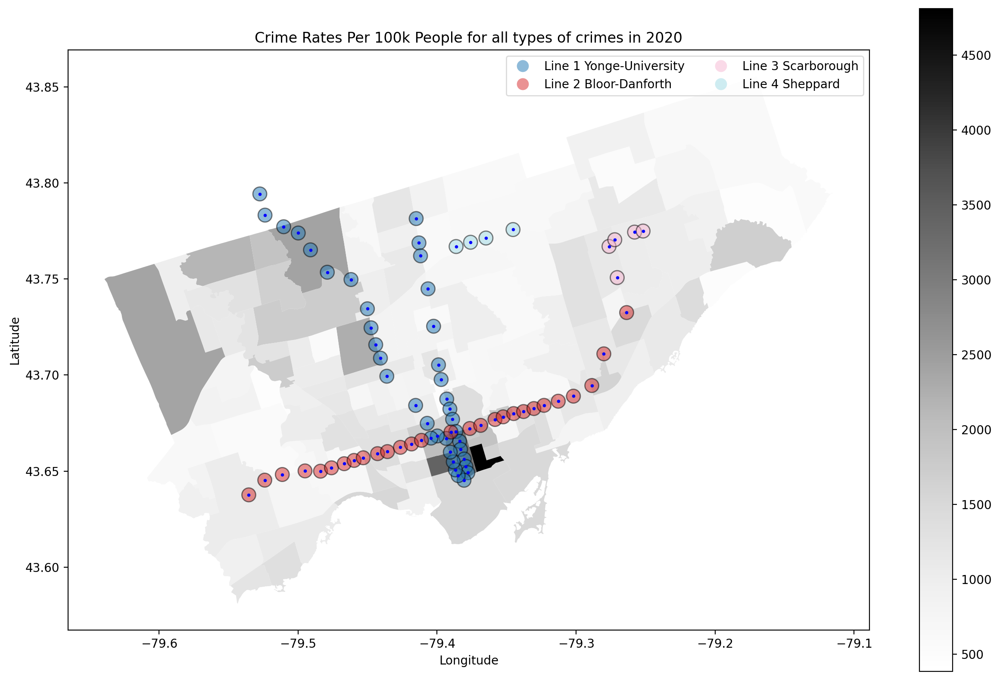

In [27]:
var = crime_rates
j = 0
year = 2020
ax = neighborhoods.plot(column = var[j] + str(year), 
                cmap = 'Greys',
                # norm = norm,
                legend = True)

stations_area.plot(column = 'line', 
                edgecolor = 'black', 
                alpha = 0.5,
                cmap = 'tab20',
                legend = True,
                legend_kwds = {'loc': 'upper right', 
                                'ncol': 2,
                                'edgecolor': 'lightgrey'},
                ax = ax)
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)

ax.set_title("Crime Rates Per 100k People for all types of crimes in " + str(year))
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")

# Import rental

In [28]:
rental = pd.read_csv("./clean_data/rental.csv")
rental

,Region,All_Apartments_Total_Listed,All_Apartments_Total_Leased,Bachelor_Bachelor_Leased,Bachelor_Avg_Lease_Rate,One_Bedroom_Bachelor_Leased,One_Bedroom_Avg_Lease_Rate,Two_Bedroom_Bachelor_Leased,Two_Bedroom_Avg_Lease_Rate,Three_Bedroom_Bachelor_Leased,Three_Bedroom_Avg_Lease_Rate,Year,Quarter
0,W01,66.0,32.0,NaN,NaN,24.0,1539.0,8.0,2031.0,NaN,NaN,2012,1
1,W02,13.0,9.0,NaN,NaN,3.0,1633.0,6.0,1679.0,NaN,NaN,2012,1
2,W03,3.0,3.0,NaN,NaN,2.0,1050.0,1.0,1650.0,NaN,NaN,2012,1
3,W04,10.0,2.0,NaN,NaN,1.0,1150.0,1.0,1350.0,NaN,NaN,2012,1
4,W05,43.0,17.0,NaN,NaN,12.0,1354.0,5.0,1578.0,NaN,NaN,2012,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,E07,125.0,99.0,NaN,NaN,41.0,1976.0,54.0,2408.0,4.0,2645.0,2021,4
1396,E08,73.0,35.0,NaN,NaN,12.0,1824.0,16.0,2215.0,7.0,2543.0,2021,4
1397,E09,226.0,188.0,5.0,1698.0,111.0,2080.0,68.0,2770.0,4.0,3275.0,2021,4
1398,E10,32.0,22.0,NaN,NaN,14.0,1813.0,7.0,2399.0,1.0,2700.0,2021,4


In [29]:
neighborhoods_rental = neighborhoods[['Neighbourhood', 'Hood_ID', 'district', 'geometry']].merge(rental, left_on='district', right_on='Region')
neighborhoods_rental

,Neighbourhood,Hood_ID,district,geometry,Region,All_Apartments_Total_Listed,All_Apartments_Total_Leased,Bachelor_Bachelor_Leased,Bachelor_Avg_Lease_Rate,One_Bedroom_Bachelor_Leased,One_Bedroom_Avg_Lease_Rate,Two_Bedroom_Bachelor_Leased,Two_Bedroom_Avg_Lease_Rate,Three_Bedroom_Bachelor_Leased,Three_Bedroom_Avg_Lease_Rate,Year,Quarter
0,Yonge-St.Clair,97,C02,"POLYGON ((-79.39115 43.68108, -79.39137 43.680...",C02,179.0,92.0,4.0,1463.0,45.0,2029.0,42.0,4104.0,1.0,4000.0,2012,1
1,Yonge-St.Clair,97,C02,"POLYGON ((-79.39115 43.68108, -79.39137 43.680...",C02,214.0,105.0,6.0,1418.0,50.0,1939.0,45.0,3918.0,4.0,5975.0,2012,2
2,Yonge-St.Clair,97,C02,"POLYGON ((-79.39115 43.68108, -79.39137 43.680...",C02,234.0,107.0,5.0,1254.0,57.0,2100.0,41.0,4019.0,4.0,6898.0,2012,3
3,Yonge-St.Clair,97,C02,"POLYGON ((-79.39115 43.68108, -79.39137 43.680...",C02,226.0,82.0,4.0,1406.0,46.0,2115.0,29.0,3397.0,3.0,4400.0,2012,4
4,Yonge-St.Clair,97,C02,"POLYGON ((-79.39115 43.68108, -79.39137 43.680...",C02,273.0,95.0,4.0,1445.0,41.0,2351.0,47.0,4247.0,3.0,5550.0,2013,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5595,Mount Pleasant West,104,C10,"POLYGON ((-79.39607 43.69566, -79.39616 43.696...",C10,1038.0,404.0,15.0,1489.0,267.0,1828.0,121.0,2643.0,1.0,6000.0,2020,4
5596,Mount Pleasant West,104,C10,"POLYGON ((-79.39607 43.69566, -79.39616 43.696...",C10,970.0,416.0,16.0,1425.0,281.0,1779.0,115.0,2556.0,4.0,3500.0,2021,1
5597,Mount Pleasant West,104,C10,"POLYGON ((-79.39607 43.69566, -79.39616 43.696...",C10,1064.0,608.0,21.0,1473.0,409.0,1789.0,174.0,2540.0,4.0,4175.0,2021,2
5598,Mount Pleasant West,104,C10,"POLYGON ((-79.39607 43.69566, -79.39616 43.696...",C10,1031.0,767.0,40.0,1566.0,501.0,1896.0,222.0,2669.0,4.0,4100.0,2021,3


<AxesSubplot:>

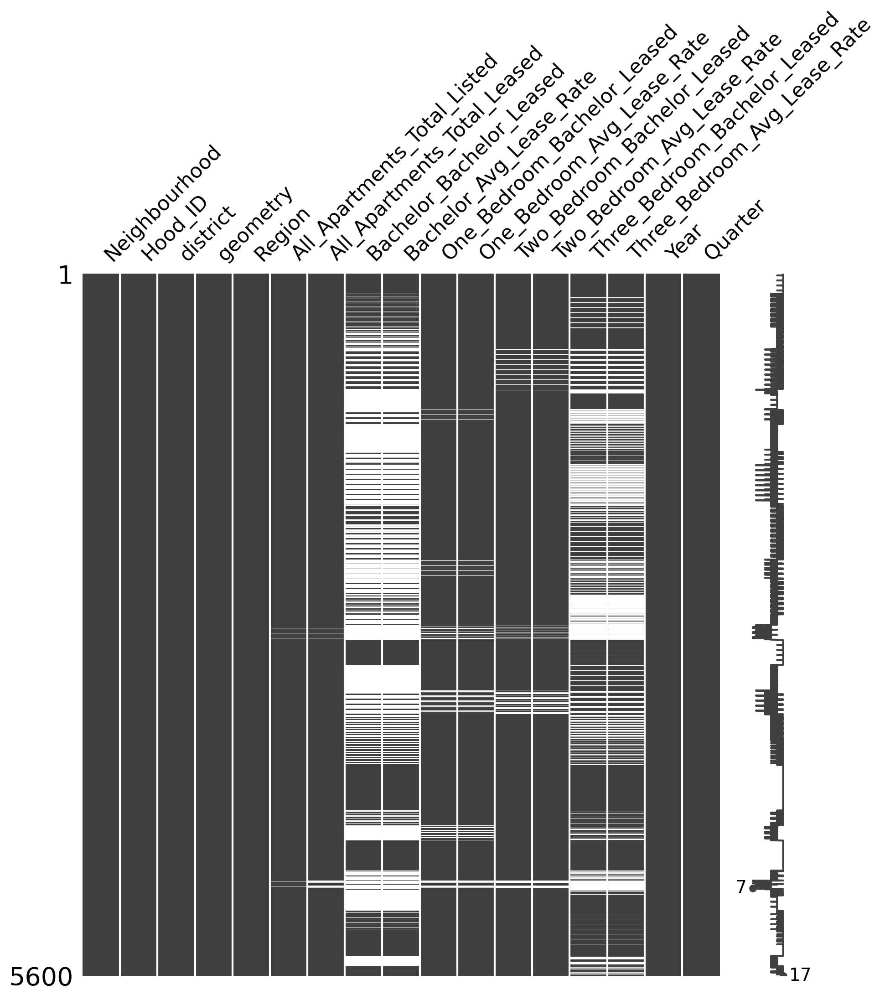

In [30]:
msno.matrix(neighborhoods_rental, figsize=(10,10))

In [31]:
neighborhoods_rental[neighborhoods_rental.isna().sum(axis=1) != 0].head()

,Neighbourhood,Hood_ID,district,geometry,Region,All_Apartments_Total_Listed,All_Apartments_Total_Leased,Bachelor_Bachelor_Leased,Bachelor_Avg_Lease_Rate,One_Bedroom_Bachelor_Leased,One_Bedroom_Avg_Lease_Rate,Two_Bedroom_Bachelor_Leased,Two_Bedroom_Avg_Lease_Rate,Three_Bedroom_Bachelor_Leased,Three_Bedroom_Avg_Lease_Rate,Year,Quarter
14,Yonge-St.Clair,97,C02,"POLYGON ((-79.39115 43.68108, -79.39137 43.680...",C02,626.0,343.0,21.0,1407.0,207.0,1975.0,115.0,3405.0,NaN,NaN,2015,3
54,Casa Loma,96,C02,"POLYGON ((-79.41465 43.67391, -79.41481 43.674...",C02,626.0,343.0,21.0,1407.0,207.0,1975.0,115.0,3405.0,NaN,NaN,2015,3
94,Annex,95,C02,"POLYGON ((-79.39410 43.66872, -79.39584 43.668...",C02,626.0,343.0,21.0,1407.0,207.0,1975.0,115.0,3405.0,NaN,NaN,2015,3
134,Wychwood,94,C02,"POLYGON ((-79.43588 43.68015, -79.43488 43.680...",C02,626.0,343.0,21.0,1407.0,207.0,1975.0,115.0,3405.0,NaN,NaN,2015,3
160,York University Heights,27,W05,"POLYGON ((-79.50525 43.75987, -79.50484 43.759...",W05,43.0,17.0,NaN,NaN,12.0,1354.0,5.0,1578.0,NaN,NaN,2012,1


In [32]:
# row 14 is the row with NA
neighborhoods_rental.iloc[13:16, 4:]

,Region,All_Apartments_Total_Listed,All_Apartments_Total_Leased,Bachelor_Bachelor_Leased,Bachelor_Avg_Lease_Rate,One_Bedroom_Bachelor_Leased,One_Bedroom_Avg_Lease_Rate,Two_Bedroom_Bachelor_Leased,Two_Bedroom_Avg_Lease_Rate,Three_Bedroom_Bachelor_Leased,Three_Bedroom_Avg_Lease_Rate,Year,Quarter
13,C02,589.0,217.0,9.0,1457.0,122.0,1779.0,84.0,4394.0,2.0,4900.0,2015,2
14,C02,626.0,343.0,21.0,1407.0,207.0,1975.0,115.0,3405.0,NaN,NaN,2015,3
15,C02,374.0,141.0,9.0,1489.0,70.0,1981.0,60.0,3697.0,2.0,8750.0,2015,4


In [33]:
neighborhoods_rental.iloc[13:16,4:].ffill(axis=0)

,Region,All_Apartments_Total_Listed,All_Apartments_Total_Leased,Bachelor_Bachelor_Leased,Bachelor_Avg_Lease_Rate,One_Bedroom_Bachelor_Leased,One_Bedroom_Avg_Lease_Rate,Two_Bedroom_Bachelor_Leased,Two_Bedroom_Avg_Lease_Rate,Three_Bedroom_Bachelor_Leased,Three_Bedroom_Avg_Lease_Rate,Year,Quarter
13,C02,589.0,217.0,9.0,1457.0,122.0,1779.0,84.0,4394.0,2.0,4900.0,2015,2
14,C02,626.0,343.0,21.0,1407.0,207.0,1975.0,115.0,3405.0,2.0,4900.0,2015,3
15,C02,374.0,141.0,9.0,1489.0,70.0,1981.0,60.0,3697.0,2.0,8750.0,2015,4


In [34]:
# if we don't have rental transactions in this quarter, we use the number from the last quarter
# forward fillna for the columns other than the first 4 columns (Neighbourhood, Hood_ID, district, geometry)
neighborhoods_rental.iloc[:,4:] = neighborhoods_rental.iloc[:,4:].ffill(axis=0).values

In [50]:
neighborhoods_rental['One_Bedroom_Avg_Lease_Rate'].min(), neighborhoods_rental['One_Bedroom_Avg_Lease_Rate'].max()

(850.0, 2878.0)

In [105]:
rental_years = neighborhoods_rental.Year.unique()
rental_quarters = neighborhoods_rental.Quarter.unique()
def plot_rental(var, title):
    fig, axes = plt.subplots(len(rental_quarters), len(rental_years))
    
    for j in range(axes.shape[1]):
        
        # due to inflation, rental rates in recent years must be higher than those in previous years
        # therefore, it would only make sense to fix the range for the colorbar 
        # such that we compare across quarters to observe seasonal effect (if any) in each year, but not across years
        # selected_period = neighborhoods_rental.loc[(neighborhoods_rental['Year'] == rental_years[j])]
        # vmin, vmax = selected_period[var].min(), selected_period[var].max()
        # norm = TwoSlopeNorm(vmin=vmin, vcenter= np.mean([vmin, vmax]), vmax=vmax)    
        
        for i in range(axes.shape[0]):         
            plot_df = neighborhoods_rental.loc[(neighborhoods_rental['Quarter'] == rental_quarters[i]) & (neighborhoods_rental['Year'] == rental_years[j])]
            plot_df.plot(column = var, cmap = 'viridis', 
                        #  norm = norm, 
                         ax = axes[i, j])
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].set_yticks([])
            if i == 0:
                axes[i,j].set_title(rental_years[j])
            if j == 0:
                axes[i,j].set_ylabel("Q" + str(rental_quarters[i]), rotation=90, size='large')

    fig.suptitle(title, size='xx-large')

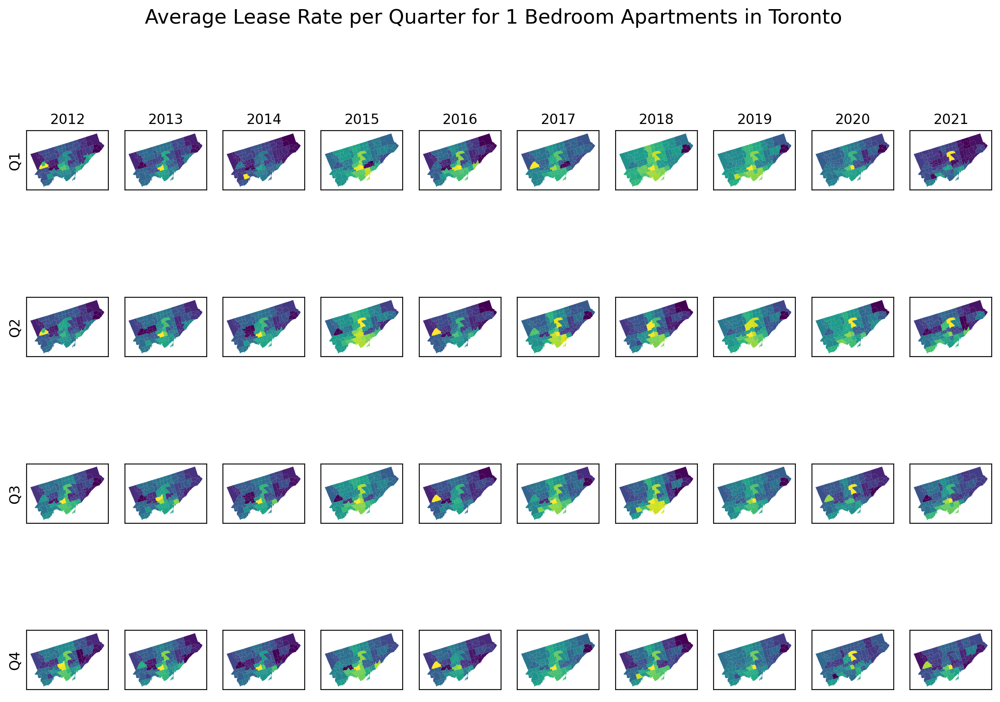

In [115]:
plot_rental('One_Bedroom_Avg_Lease_Rate', 'Average Lease Rate per Quarter for 1 Bedroom Apartments in Toronto')

In [116]:
neighborhoods_rental.columns

Index(['Neighbourhood', 'Hood_ID', 'district', 'geometry', 'Region',
       'All_Apartments_Total_Listed', 'All_Apartments_Total_Leased',
       'Bachelor_Bachelor_Leased', 'Bachelor_Avg_Lease_Rate',
       'One_Bedroom_Bachelor_Leased', 'One_Bedroom_Avg_Lease_Rate',
       'Two_Bedroom_Bachelor_Leased', 'Two_Bedroom_Avg_Lease_Rate',
       'Three_Bedroom_Bachelor_Leased', 'Three_Bedroom_Avg_Lease_Rate', 'Year',
       'Quarter'],
      dtype='object')

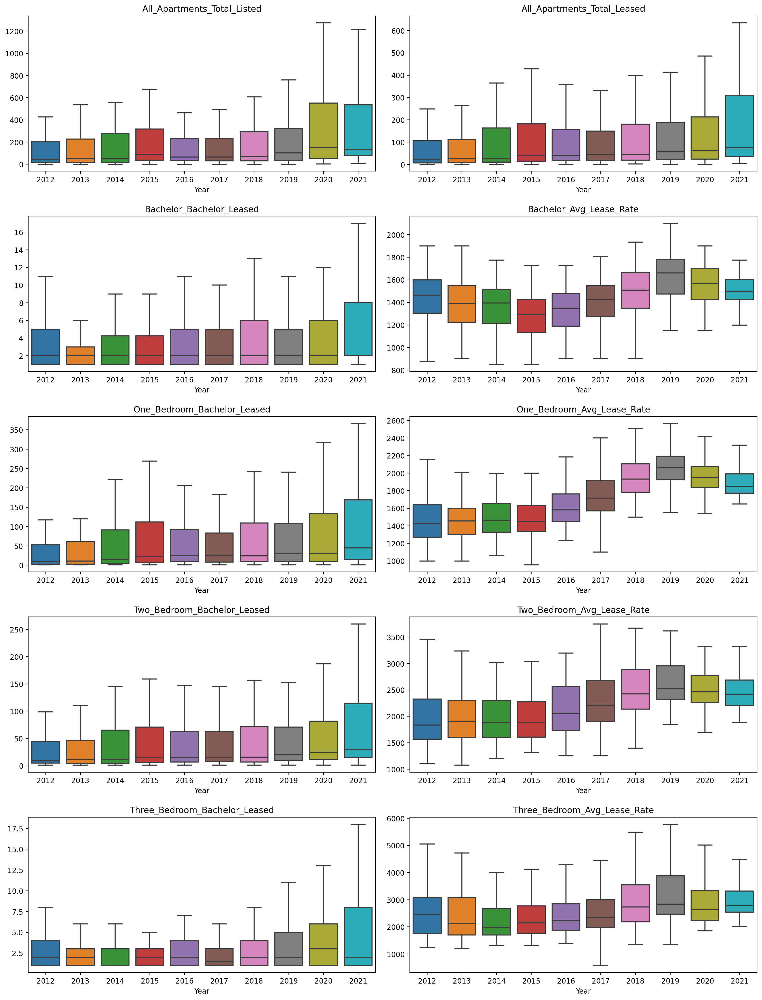

In [134]:
vars = ['All_Apartments_Total_Listed', 'All_Apartments_Total_Leased',
       'Bachelor_Bachelor_Leased', 'Bachelor_Avg_Lease_Rate',
       'One_Bedroom_Bachelor_Leased', 'One_Bedroom_Avg_Lease_Rate',
       'Two_Bedroom_Bachelor_Leased', 'Two_Bedroom_Avg_Lease_Rate',
       'Three_Bedroom_Bachelor_Leased', 'Three_Bedroom_Avg_Lease_Rate']

fig, axes = plt.subplots(int(len(vars)/2),2)
fig.tight_layout()
plt.subplots_adjust(top=1.9)
for var, ax in zip(vars, axes.flatten()):
    sns.boxplot(x='Year', y=var,data=neighborhoods_rental, 
                showfliers = False, # remove outliers
                ax=ax)
    ax.set_ylabel('')
    ax.set_title(var)

In [167]:
selected_year = 2021
selected_quarter = 4
var = 'One_Bedroom_Avg_Lease_Rate'

Top 5 expensive neighborhoods: 
 district
C09    2498.0
W09    2400.0
C02    2320.0
C01    2239.0
E01    2180.0
Name: One_Bedroom_Avg_Lease_Rate, dtype: float64


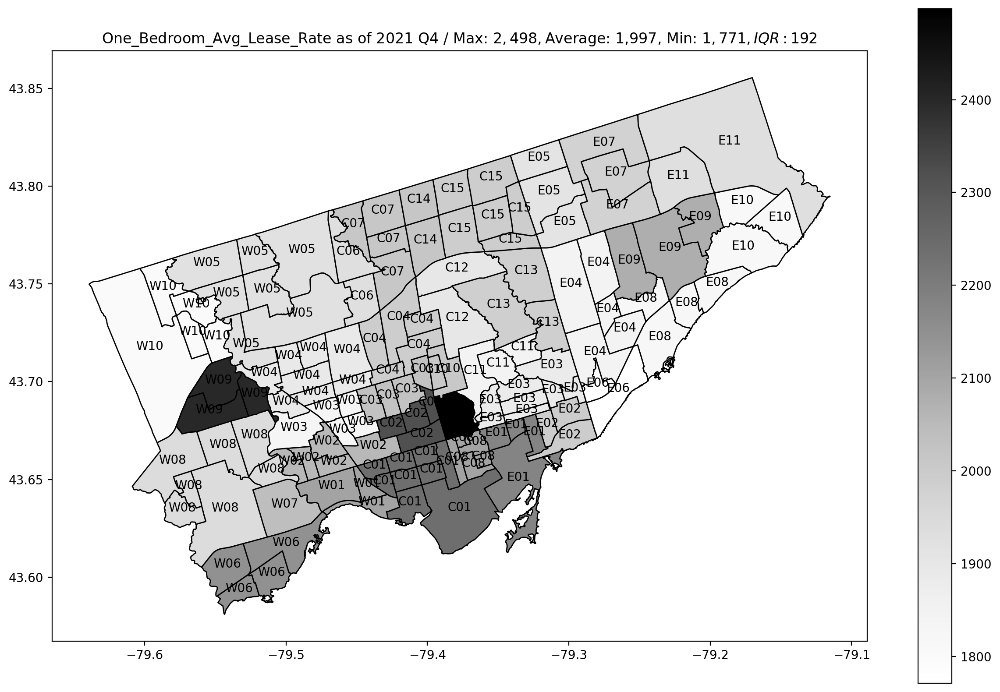

In [168]:
selected_period = neighborhoods_rental.loc[(neighborhoods_rental['Year'] == selected_year) & (neighborhoods_rental['Quarter'] == selected_quarter)]
ax = selected_period.plot(column = var, 
                     legend = True,
                     edgecolor = 'black',
                     cmap = "Greys")
for geometry, label in zip(selected_period.geometry, selected_period.district):
    ax.annotate(label, xy=(geometry.centroid.x, geometry.centroid.y), ha='center')
    
ax.set_title(f"{var} as of {selected_year} Q{selected_quarter} / Max: ${selected_period[var].max():,.0f}, $Average: {selected_period[var].mean():,.0f}, Min: ${selected_period[var].min():,.0f}, IQR: ${selected_period[var].quantile(0.75) - selected_period[var].quantile(0.25):,.0f}")

print("Top 5 expensive neighborhoods: \n",neighborhoods_rental.loc[(neighborhoods_rental['Year'] == selected_year) & (neighborhoods_rental['Quarter'] == selected_quarter)].groupby('district')[var].mean().sort_values(ascending=False).head())

Text(0.5, 378.8854486312057, 'Longitude')

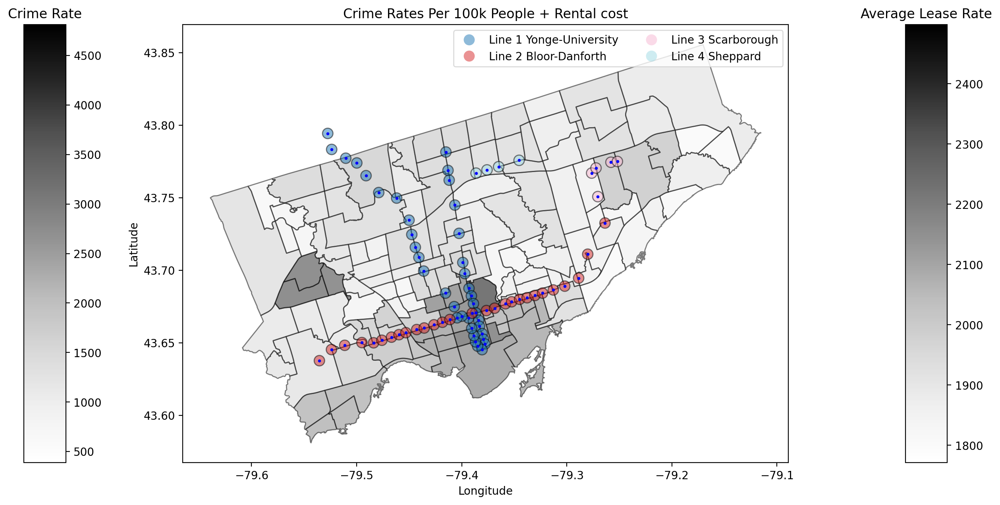

In [228]:
# safety: alpha = 1
# rental: alpha = 0.5
fig, ax = plt.subplots(1, 1)
divider = make_axes_locatable(ax)
cax = divider.append_axes("left", size="5%", pad=0.01)
cax.title.set_text('Crime Rate')
crime_plot = neighborhoods.plot(column = 'All_Rate' + str(2020), 
                cmap = 'Greys',
                alpha = 0.5,
                ax = ax,
                cax = cax,
                legend = True,
                )

selected_period = neighborhoods_rental.loc[(neighborhoods_rental['Year'] == 2021) & (neighborhoods_rental['Quarter'] == 4)]
cax2 = divider.append_axes("right", size="5%", pad=0.01)
cax2.title.set_text('Average Lease Rate')
selected_period.plot(column = 'One_Bedroom_Avg_Lease_Rate', 
                     legend = True,
                     edgecolor = 'black',
                     alpha = 0.5,
                     cmap = "Greys",
                     ax = ax,
                     cax = cax2,
                     )


stations_area.plot(column = 'line', 
                edgecolor = 'black', 
                alpha = 0.5,
                cmap = 'tab20',
                legend = True,
                legend_kwds = {'loc': 'upper right', 
                                'ncol': 2,
                                'edgecolor': 'lightgrey'},
                ax = ax)
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)

ax.set_title("Crime Rates Per 100k People + Rental cost")
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")


In [207]:
cax2

<Axes:title={'center':'Average Lease Rate'}>

# Import major crime indicators

In [40]:
# geojson format is too big -> use csv instead
mci_point = pd.read_csv('./clean_data/mci_point.csv')
mci_point['geometry'] = mci_point.apply(lambda x: shapely.geometry.Point(x['Long'], x['Lat']), axis=1)
mci_point = gpd.GeoDataFrame(mci_point, crs='epsg:' + str(epsg_3d), geometry='geometry')

C:\Users\willi\miniconda3\envs\police\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



In [236]:
mci_point

,X,Y,Index_,event_unique_id,Division,occurrencedate,reporteddate,premisetype,ucr_code,ucr_ext,offence,reportedyear,reportedmonth,reportedday,reporteddayofyear,reporteddayofweek,reportedhour,occurrenceyear,occurrencemonth,occurrenceday,occurrencedayofyear,occurrencedayofweek,occurrencehour,MCI,Hood_ID,Neighbourhood,Long,Lat,ObjectId,geometry
0,-8.854229e+06,5.425760e+06,1,GO-20141624853,D31,2014-03-02 05:00:00+00:00,2014/03/02 05:00:00+00,Apartment,1430,100,Assault,2014,March,2,61,Sunday,5,2014.0,March,2.0,61.0,Sunday,5,Assault,22,Humbermede,-79.538894,43.743025,1,POINT (-79.53889 43.74302)
1,-8.834951e+06,5.412259e+06,2,GO-20141625057,D51,2014-03-02 05:00:00+00:00,2014/03/02 05:00:00+00,Commercial,2120,200,B&E,2014,March,2,61,Sunday,7,2014.0,March,2.0,61.0,Sunday,4,Break and Enter,73,Moss Park,-79.365716,43.655340,2,POINT (-79.36572 43.65534)
2,-8.825836e+06,5.417935e+06,3,GO-20141259602,D41,2013-12-31 05:00:00+00:00,2014/01/01 05:00:00+00,Commercial,2120,220,B&E W'Intent,2014,January,1,1,Wednesday,0,2013.0,December,31.0,365.0,Tuesday,23,Break and Enter,121,Oakridge,-79.283837,43.692217,3,POINT (-79.28384 43.69222)
3,-8.847703e+06,5.416571e+06,4,GO-20141260128,D12,2014-01-01 05:00:00+00:00,2014/01/01 05:00:00+00,House,1430,100,Assault,2014,January,1,1,Wednesday,1,2014.0,January,1.0,1.0,Wednesday,1,Assault,111,Rockcliffe-Smythe,-79.480268,43.683360,4,POINT (-79.48027 43.68336)
4,-8.837275e+06,5.411569e+06,5,GO-20141259483,D52,2013-12-31 05:00:00+00:00,2014/01/01 05:00:00+00,Transit,1430,100,Assault,2014,January,1,1,Wednesday,1,2013.0,December,31.0,365.0,Tuesday,21,Assault,76,Bay Street Corridor,-79.386589,43.650853,5,POINT (-79.38659 43.65085)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259618,-8.835231e+06,5.421552e+06,262198,GO-2021995584,D53,2021-05-29 04:00:00+00:00,2021/05/29 04:00:00+00,House,2135,210,Theft Of Motor Vehicle,2021,May,29,149,Saturday,9,2021.0,May,29.0,149.0,Saturday,2,Auto Theft,56,Leaside-Bennington,-79.368232,43.715704,262703,POINT (-79.36823 43.71570)
259619,-8.849750e+06,5.417652e+06,262199,GO-2021994271,D12,2021-05-29 04:00:00+00:00,2021/05/29 04:00:00+00,Outside,2135,210,Theft Of Motor Vehicle,2021,May,29,149,Saturday,1,2021.0,May,29.0,149.0,Saturday,0,Auto Theft,115,Mount Dennis,-79.498654,43.690380,262704,POINT (-79.49865 43.69038)
259620,-8.849750e+06,5.417652e+06,262200,GO-2021994271,D12,2021-05-29 04:00:00+00:00,2021/05/29 04:00:00+00,Outside,2135,210,Theft Of Motor Vehicle,2021,May,29,149,Saturday,1,2021.0,May,29.0,149.0,Saturday,0,Auto Theft,115,Mount Dennis,-79.498654,43.690380,262705,POINT (-79.49865 43.69038)
259621,-8.834998e+06,5.421758e+06,262201,GO-2021994920,D53,2021-05-29 04:00:00+00:00,2021/05/29 04:00:00+00,House,2135,210,Theft Of Motor Vehicle,2021,May,29,149,Saturday,5,2021.0,May,29.0,149.0,Saturday,2,Auto Theft,56,Leaside-Bennington,-79.366138,43.717042,262706,POINT (-79.36614 43.71704)


In [255]:
mci_point[mci_point.event_unique_id == 'GO-20189016704']

,X,Y,Index_,event_unique_id,Division,occurrencedate,reporteddate,premisetype,ucr_code,ucr_ext,offence,reportedyear,reportedmonth,reportedday,reporteddayofyear,reporteddayofweek,reportedhour,occurrenceyear,occurrencemonth,occurrenceday,occurrencedayofyear,occurrencedayofweek,occurrencehour,MCI,Hood_ID,Neighbourhood,Long,Lat,ObjectId,geometry


In [247]:
mci_point.MCI.unique()

array(['Assault', 'Break and Enter', 'Robbery', 'Theft Over',
       'Auto Theft'], dtype=object)

<AxesSubplot:xlabel='occurrenceyear', ylabel='event_unique_id'>

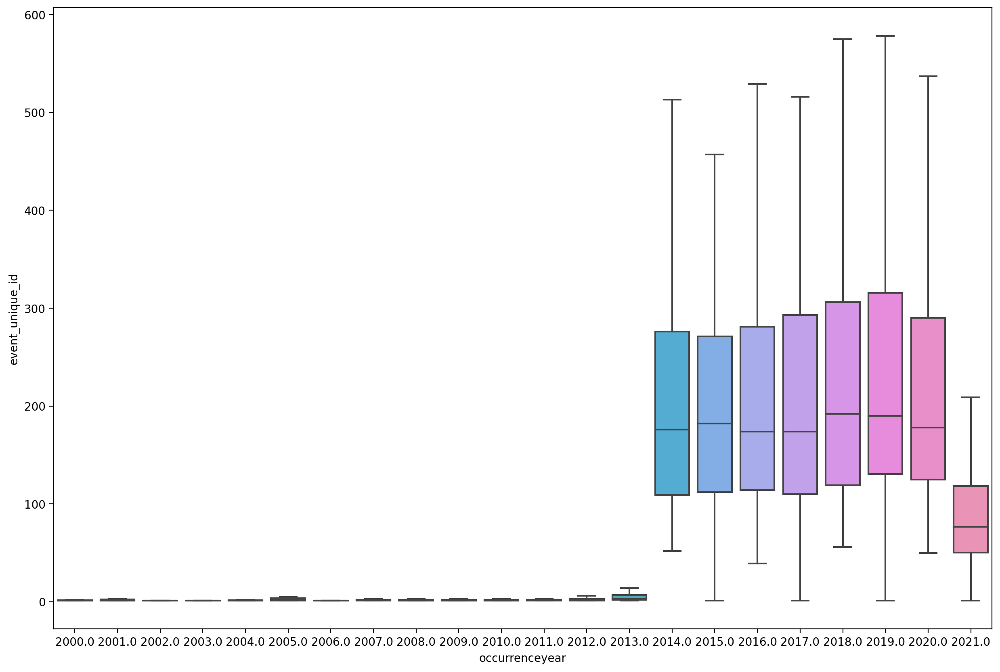

In [244]:
sns.boxplot(data = mci_point[mci_point['occurrenceyear'] >= 2000].groupby(['Neighbourhood', 'occurrenceyear'])['event_unique_id'].count().reset_index(drop=False), 
            x = 'occurrenceyear',
            y = 'event_unique_id',
            showfliers = False)

# Import traffic collisions

In [42]:
# geojson format is too big -> use csv instead
collision_point = pd.read_csv('./clean_data/collision_point.csv')
collision_point['geometry'] = collision_point.apply(lambda x: shapely.geometry.Point(x['Long'], x['Lat']), axis=1)
collision_point = gpd.GeoDataFrame(collision_point, crs='epsg:' + str(epsg_3d), geometry='geometry')

C:\Users\willi\miniconda3\envs\police\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



In [43]:
collision_point

,X,Y,OBJECTID,EventUniqueId,OccurrenceDate,Month,Day_of_Week,Year,Hour,Division,...,Neighbourhood,Fatalities,Injury_Collisions,FTR_Collisions,PD_Collisions,Long,Lat,ObjectId2,Hood_ID,geometry
0,0.000000e+00,0.000000e+00,278,GO-20141591056,2014/02/24 05:00:00+00,February,Monday,2014,17,D32,...,St.Andrew-Windfields,0,NO,YES,NO,-79.402034,43.748097,178,40,POINT (-79.40203 43.74810)
1,0.000000e+00,0.000000e+00,1246,GO-20143120578,2014/10/17 04:00:00+00,October,Friday,2014,9,D31,...,Glenfield-Jane Heights,0,NO,NO,YES,-79.513544,43.743014,1046,25,POINT (-79.51354 43.74301)
2,0.000000e+00,0.000000e+00,21564,GO-20168056919,2016/12/17 05:00:00+00,December,Saturday,2016,9,D31,...,York University Heights,0,NO,NO,YES,-79.498253,43.763907,21094,27,POINT (-79.49825 43.76391)
3,0.000000e+00,0.000000e+00,21709,GO-20168059092,2016/12/27 05:00:00+00,December,Tuesday,2016,18,D32,...,Yorkdale-Glen Park,0,NO,YES,NO,-79.459962,43.707040,21162,31,POINT (-79.45996 43.70704)
4,0.000000e+00,0.000000e+00,21277,GO-20168053844,2016/11/30 05:00:00+00,November,Wednesday,2016,18,D33,...,Hillcrest Village,0,NO,NO,YES,-79.352088,43.807805,21340,48,POINT (-79.35209 43.80780)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430281,-8.865398e+06,5.426816e+06,499212,GO-20178006796,2017/02/14 05:00:00+00,February,Tuesday,2017,14,NSA,...,NSA,0,NO,NO,YES,-79.639225,43.749873,499534,NSA,POINT (-79.63923 43.74987)
430282,-8.865398e+06,5.426816e+06,499213,GO-20178007507,2017/02/18 05:00:00+00,February,Saturday,2017,13,NSA,...,NSA,0,NO,YES,NO,-79.639225,43.749873,499535,NSA,POINT (-79.63923 43.74987)
430283,-8.865398e+06,5.426816e+06,499214,GO-20178008123,2017/02/22 05:00:00+00,February,Wednesday,2017,22,D23,...,West Humber-Clairville,0,NO,NO,YES,-79.639225,43.749873,499536,1,POINT (-79.63923 43.74987)
430284,-8.865398e+06,5.426816e+06,499215,GO-20178014940,2017/04/07 04:00:00+00,April,Friday,2017,14,NSA,...,NSA,0,NO,NO,YES,-79.639225,43.749873,499537,NSA,POINT (-79.63923 43.74987)


# Crime around subway stations

In [44]:
crime_around_stations = gpd.sjoin(mci_point, stations_area, op='intersects')
crime_around_stations

C:\Users\willi\miniconda3\envs\police\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



,X,Y,Index_,event_unique_id,Division,occurrencedate,reporteddate,premisetype,ucr_code,ucr_ext,...,distance_km_order,commute_time_order,url,station,line,order,longitude,latitude,commute_time,distance_km
4,-8.837275e+06,5.411569e+06,5,GO-20141259483,D52,2013-12-31 05:00:00+00:00,2014/01/01 05:00:00+00,Transit,1430,100,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
61,-8.836874e+06,5.410915e+06,66,GO-20141262372,D52,2014-01-01 05:00:00+00:00,2014/01/01 05:00:00+00,Commercial,2120,200,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
583,-8.836993e+06,5.410881e+06,795,GO-20141328312,D52,2014-01-12 05:00:00+00:00,2014/01/12 05:00:00+00,Other,1430,100,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
663,-8.837155e+06,5.411264e+06,976,GO-20141343564,D52,2014-01-12 05:00:00+00:00,2014/01/14 05:00:00+00,Apartment,2130,210,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
926,-8.836833e+06,5.411571e+06,247,GO-20141274610,D52,2014-01-03 05:00:00+00:00,2014/01/03 05:00:00+00,Commercial,2130,210,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202539,-8.851130e+06,5.431108e+06,205396,GO-20201490510,D31,2020-08-09 04:00:00+00:00,2020/08/09 04:00:00+00,Commercial,1430,100,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914
211149,-8.851130e+06,5.431108e+06,213747,GO-20202193214,D31,2020-11-19 05:00:00+00:00,2020/11/19 05:00:00+00,Outside,1430,100,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914
214977,-8.851130e+06,5.431108e+06,217867,GO-2021101646,D31,2021-01-17 05:00:00+00:00,2021/01/17 05:00:00+00,Outside,1430,100,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914
225937,-8.851130e+06,5.431108e+06,228998,GO-20211136719,D31,2021-06-17 04:00:00+00:00,2021/06/17 04:00:00+00,Transit,1420,110,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914


<AxesSubplot:>

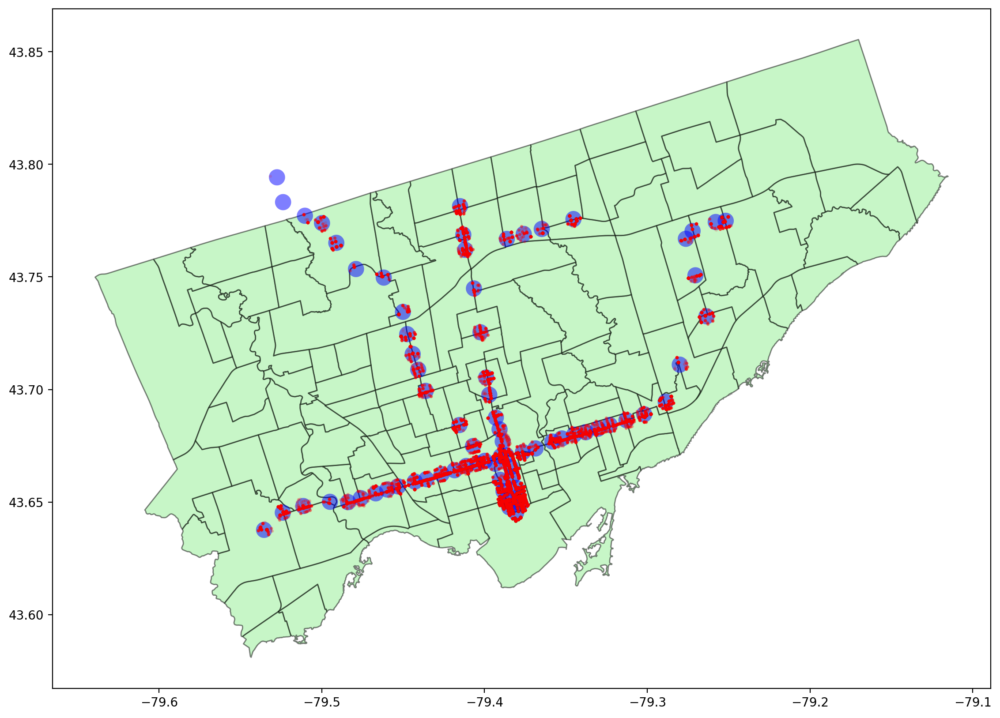

In [45]:
ax = neighborhoods.plot(color = 'lightgreen', edgecolor = 'black', alpha = 0.5)
stations_area.plot(ax=ax, color = 'blue', markersize = 3, alpha = 0.5)
crime_around_stations.plot(ax=ax, color = 'red', markersize = 3, alpha = 0.1)

<AxesSubplot:>

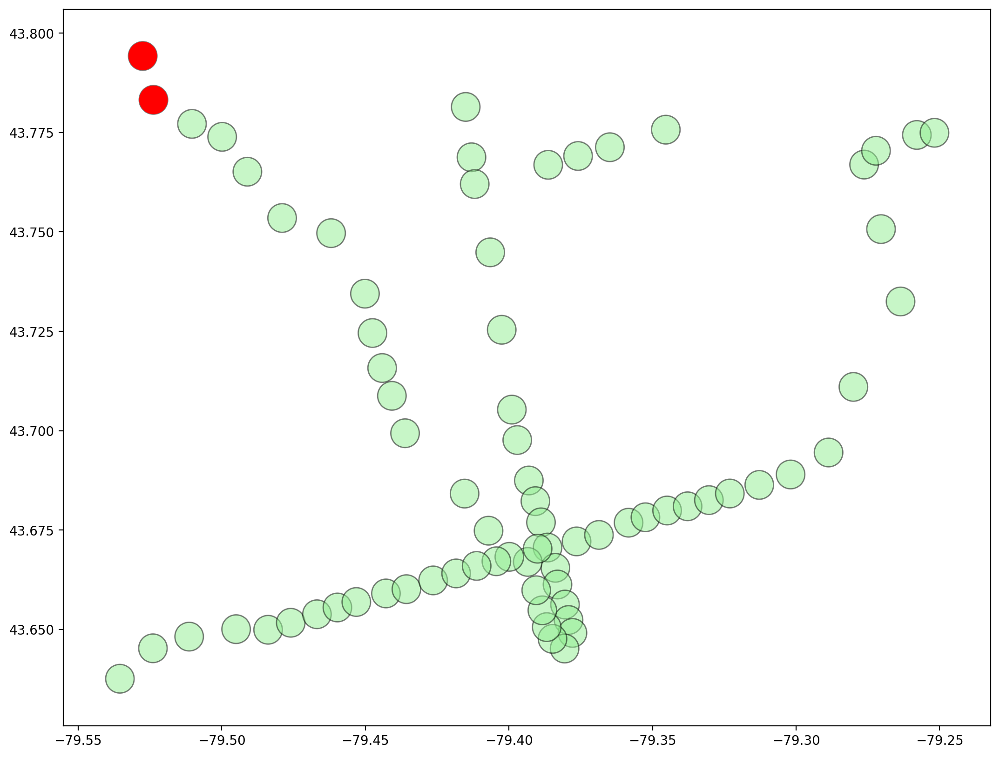

In [46]:
# checking there are actually crime around the 2 stations outside the neighbourhoods
ax = stations_area.plot(color = 'lightgreen', edgecolor = 'black', alpha = 0.5)
stations_area[(stations_area['station'] == 'highway 407') | (stations_area['station'] == 'vaughan metropolitan centre')].plot(ax=ax, color = 'red', markersize = 3)

In [47]:
gpd.sjoin(mci_point, stations_area[(stations_area['station'] == 'highway 407') | (stations_area['station'] == 'vaughan metropolitan centre')],
          op='intersects')

C:\Users\willi\miniconda3\envs\police\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



,X,Y,Index_,event_unique_id,Division,occurrencedate,reporteddate,premisetype,ucr_code,ucr_ext,...,distance_km_order,commute_time_order,url,station,line,order,longitude,latitude,commute_time,distance_km
230404,-8.853438e+06,5.433740e+06,233332,GO-20143349474,NSA,2014-11-08 05:00:00+00:00,2014/11/22 05:00:00+00,Outside,2135,210,...,74,64,https://www.ttc.ca/subway-stations/vaughan-met...,vaughan metropolitan centre,Line 1 Yonge-University,37,-79.527487,43.794244,44,18.050992


In [48]:
crime_around_stations.groupby('station')['event_unique_id'].count().sort_values(ascending=False)

station
dundas                         4856
college                        3633
queen                          3583
wellesley                      2983
bloor yonge                    2461
                               ... 
ellesmere                        83
old mill                         56
pioneer village                  53
downsview park                   42
vaughan metropolitan centre       1
Name: event_unique_id, Length: 74, dtype: int64

# Neighborhood crime rate

In [49]:
neighbourhood_count = pd.DataFrame(mci_point["Hood_ID"].value_counts())
neighbourhood_count = neighbourhood_count.reset_index().rename(columns = {'index': 'Hood_ID', 'Hood_ID': 'count'})
neighbourhood_count

,Hood_ID,count
0,77,9645
1,75,8563
2,76,7619
3,1,6939
4,73,6382
...,...,...
136,140,496
137,97,486
138,60,473
139,29,472
